# Nama: Tenno Cahyo Berliantoko

# NIM: 25/568393/PA/23995

## PCD Assignment 01 - Image Sampling
The objective of this experiment is to implement and compare several image down sampling and up sampling methods.

  Downsampling

    Max

    Average

    Median

Upsampling


    Nearest Neighbor

    Bilinear

    Bicubic

In [101]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from google.colab import drive

In [102]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [103]:
INPUT_FOLDER = "/content/drive/MyDrive/PCD_Assignment01/images"

OUTPUT_FOLDER = "/content/drive/MyDrive/PCD_Assignment01/results"

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

print("Input folder :", INPUT_FOLDER)

Input folder : /content/drive/MyDrive/PCD_Assignment01/images


In [104]:
image_files = []
valid_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".webp")
for file in os.listdir(INPUT_FOLDER):
    if file.lower().endswith(valid_extensions):
        image_files.append(file)
image_files.sort()

for i, file in enumerate(image_files):
    print(f"{i+1}. {file}")


1. DoksliKemerdekaan.jpg
2. JalanRaya.jpg
3. Potret.jpg
4. bintanglaut.jpg
5. fosil.jpg


In [105]:
def load_image(path):
  image=cv2.imread(path)
  if image is None:
        raise ValueError(f"NoGambar: {path}")
  image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  return image


In [106]:
input_path = os.path.join(INPUT_FOLDER, image_files[0]) # Assuming image_files and INPUT_FOLDER are defined from previous cells
image = load_image(input_path)
image = cv2.resize(image,(512, 512),interpolation=cv2.INTER_AREA)

##1. Down Sampling
Down sampling is the process of reducing the resolution or size of an image. Three different methods are used in this experiment.

### Max Down Sampling

Max down sampling selects the maximum pixel value within a specific pixel region. This method tends to preserve areas with high intensity values.

### Average Down Sampling

Average down sampling calculates the average pixel value within each pixel region. This produces a smoother image and can reduce small variations or noise.

### Median Down Sampling

Median down sampling selects the median pixel value within each pixel region. This method is useful for reducing the influence of extreme pixel values and noise.

In [107]:
def max_downsampling(image, scale=5):
    h, w=image.shape[:2]
    new_h=h//scale
    new_w=w//scale
    cropped=image[:new_h*scale, :new_w*scale]
    if len(image.shape)==3:
        reshaped=cropped.reshape(new_h, scale, new_w, scale, 3)
        result=reshaped.max(axis=(1, 3))
    else:
        reshaped=cropped.reshape(new_h, scale, new_w, scale)
        result=reshaped.max(axis=(1, 3))
    return result.astype(np.uint8)

def average_downsampling(image, scale=5):
    h, w=image.shape[:2]
    new_h=h//scale
    new_w=w//scale
    cropped=image[:new_h*scale, :new_w*scale]
    if len(image.shape)==3:
        reshaped=cropped.reshape(new_h, scale, new_w, scale, 3)
        result=reshaped.mean(axis=(1, 3))
    else:
        reshaped=cropped.reshape(new_h, scale,new_w, scale)
        result=reshaped.mean(axis=(1, 3))
    return result.astype(np.uint8)

def median_downsampling(image, scale=5):
    h, w=image.shape[:2]
    new_h=h//scale
    new_w=w//scale
    cropped=image[:new_h*scale, :new_w*scale]
    if len(image.shape)==3:
        reshaped=cropped.reshape(new_h, scale, new_w, scale, 3)
        result=np.median(reshaped, axis=(1, 3))
    else:
        reshaped=cropped.reshape(new_h, scale, new_w, scale)
        result=np.median(reshaped, axis=(1, 3))
    return result.astype(np.uint8)

##2. Up Sampling

Up sampling is the process of increasing the resolution or size of an image. In this experiment, the up sampling process is performed on the result of Average Down Sampling.

###Nearest Neighbor

Nearest Neighbor interpolation uses the value of the closest pixel when generating new pixels. It is simple and fast, but the resulting image tends to look blocky or pixelated.

###Bilinear

Bilinear interpolation calculates new pixel values based on the surrounding pixels. It produces a smoother image than Nearest Neighbor.

###Bicubic

Bicubic interpolation uses more surrounding pixels to calculate new pixel values. It generally produces a smoother and more natural-looking image than Nearest Neighbor and Bilinear.

In [108]:
def nearest_neighbor(image, original_size):
    w, h=original_size
    result = cv2.resize(image,(w, h),interpolation=cv2.INTER_NEAREST)
    return result

def bilinear(image, original_size):
    w, h=original_size
    result = cv2.resize(image,(w, h),interpolation=cv2.INTER_LINEAR)
    return result

def bicubic(image, original_size):
    w, h=original_size
    result = cv2.resize(image,(w, h),interpolation=cv2.INTER_CUBIC)
    return result

In [109]:
#proses gambar
for image_file in image_files:
    input_path=os.path.join(INPUT_FOLDER, image_file)
    image=load_image(input_path)
    original_height, original_width=image.shape[:2]
    original_size = (original_width,original_height)
    print("Original size:", image.shape)

    max_result=max_downsampling(image,scale=5)
    average_result=average_downsampling(image, scale=5)
    median_result=median_downsampling(image,scale=5)

    nn_result = nearest_neighbor(max_result, original_size)
    bilinear_result = bilinear(max_result,original_size)
    bicubic_result = bicubic(max_result,original_size)

    average_nn = nearest_neighbor(average_result,original_size)
    average_bilinear = bilinear(average_result,original_size)
    average_bicubic = bicubic(average_result,original_size)



Original size: (449, 600, 3)
Original size: (475, 645, 3)
Original size: (540, 429, 3)
Original size: (251, 201, 3)
Original size: (280, 347, 3)


In [110]:
base_name = os.path.splitext(image_file)[0]
plt.tight_layout()
visualization_path = os.path.join(OUTPUT_FOLDER, f"{base_name}_comparison.jpg")
plt.savefig(visualization_path,dpi=300,bbox_inches="tight",facecolor="white")
plt.show()
plt.close()

<Figure size 640x480 with 0 Axes>

In [111]:
 # Original
Image.fromarray(image).save(os.path.join(OUTPUT_FOLDER, f"{base_name}_original.png"))

#down Sampling
Image.fromarray(max_result).save( os.path.join(OUTPUT_FOLDER, f"{base_name}_max.png"))
Image.fromarray(average_result).save(os.path.join(OUTPUT_FOLDER, f"{base_name}_average.png"))
Image.fromarray(median_result).save(os.path.join(OUTPUT_FOLDER,f"{base_name}_median.png"))

# Upsampling
Image.fromarray(nn_result).save(os.path.join(OUTPUT_FOLDER, f"{base_name}_nearest.png"))
Image.fromarray(bilinear_result).save(os.path.join( OUTPUT_FOLDER,f"{base_name}_bilinear.png"))
Image.fromarray(bicubic_result).save(os.path.join(OUTPUT_FOLDER,f"{base_name}_bicubic.png"))

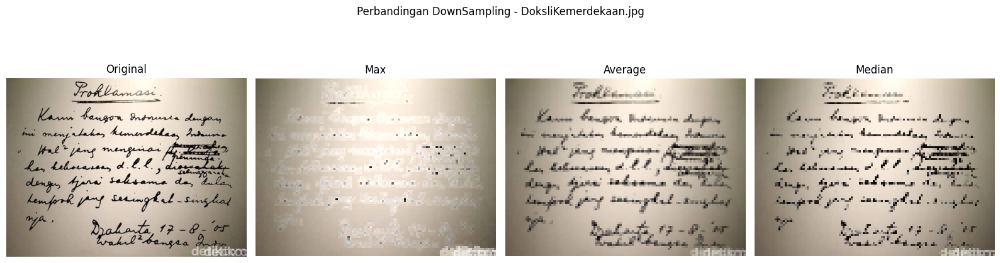

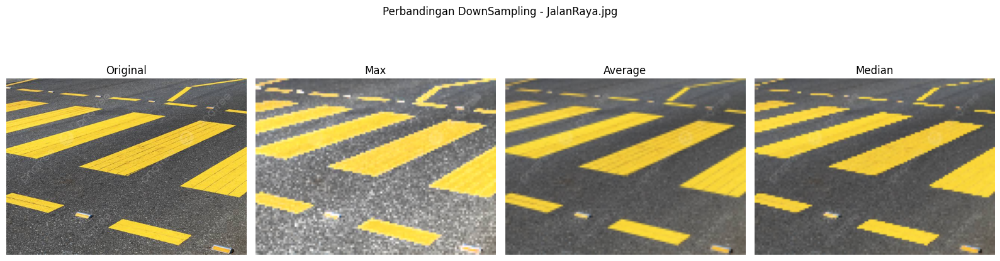

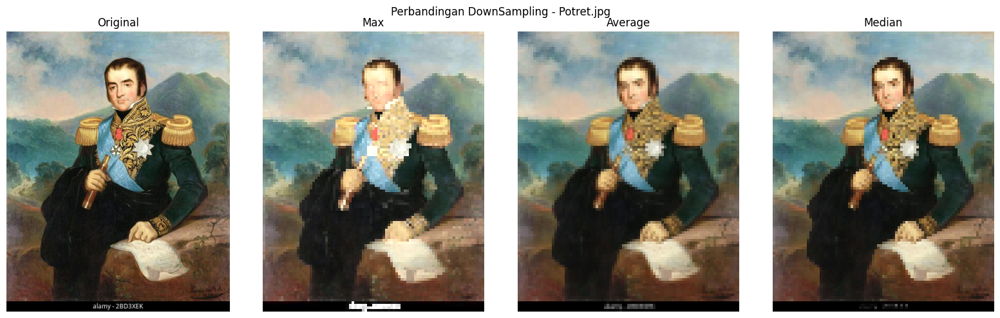

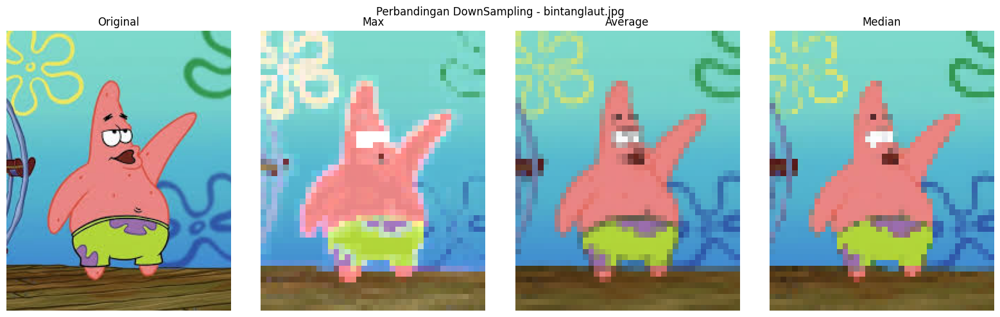

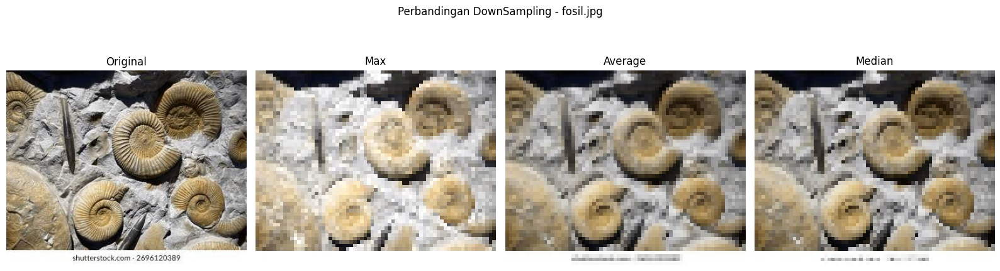

In [112]:
for image_file in image_files:
    input_path=os.path.join(INPUT_FOLDER,image_file)
    image=load_image(input_path)
    max_result=max_downsampling(image)
    average_result=average_downsampling(image)
    median_result=median_downsampling(image)

    plt.figure(figsize=(16, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(max_result)
    plt.title("Max")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(average_result)
    plt.title("Average")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(median_result)
    plt.title("Median")
    plt.axis("off")

    plt.suptitle(f"Perbandingan DownSampling - {image_file}")
    plt.tight_layout()
    plt.show()

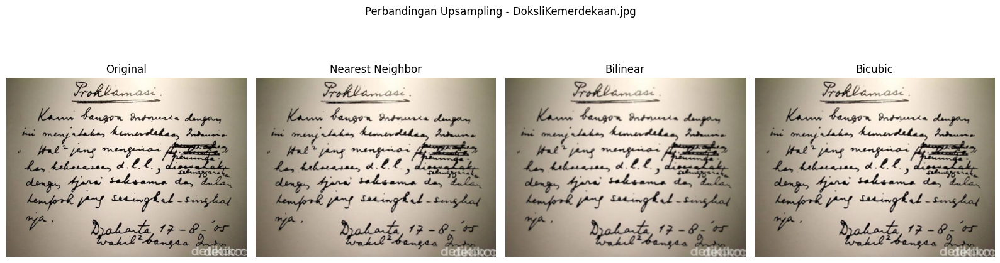

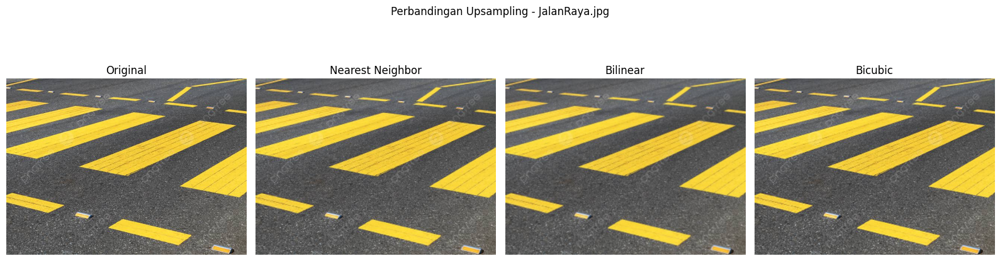

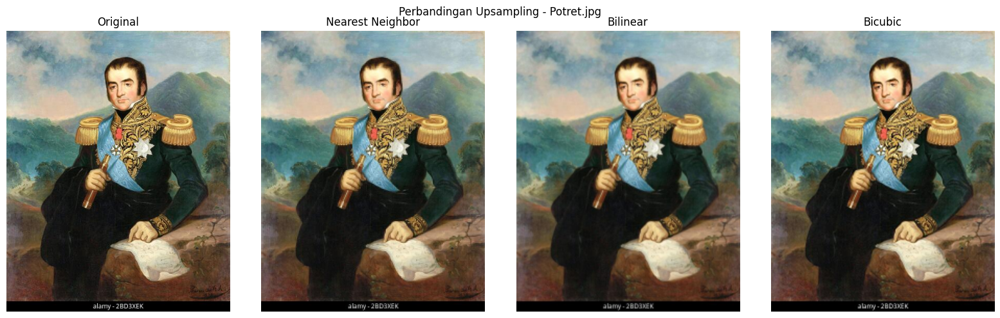

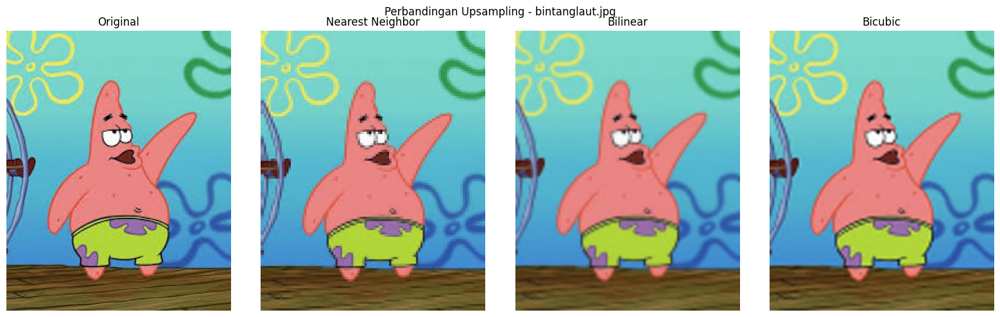

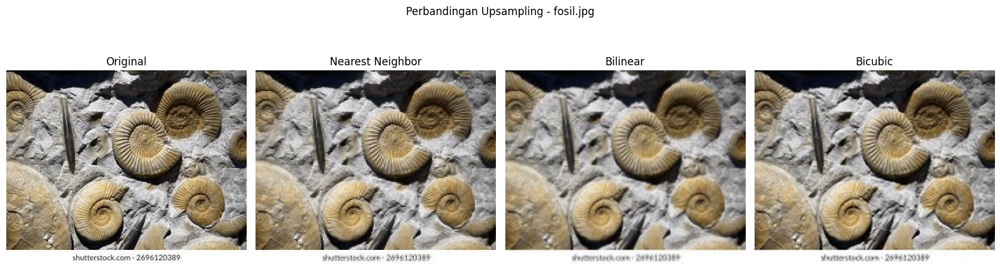

In [113]:
for image_file in image_files:
    input_path=os.path.join(INPUT_FOLDER, image_file)
    image=load_image(input_path)
    downsampled = average_downsampling(image,scale=2)
    original_size = (image.shape[1],image.shape[0])
    nn_result = nearest_neighbor(downsampled,original_size)
    bilinear_result = bilinear(downsampled,original_size)
    bicubic_result = bicubic(downsampled,original_size)

    plt.figure(figsize=(16, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")


    plt.subplot(1, 4, 2)
    plt.imshow(nn_result)
    plt.title("Nearest Neighbor")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(bilinear_result)
    plt.title("Bilinear")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(bicubic_result)
    plt.title("Bicubic")
    plt.axis("off")

    plt.suptitle(f"Perbandingan Upsampling - {image_file}")

    plt.tight_layout()
    plt.show()


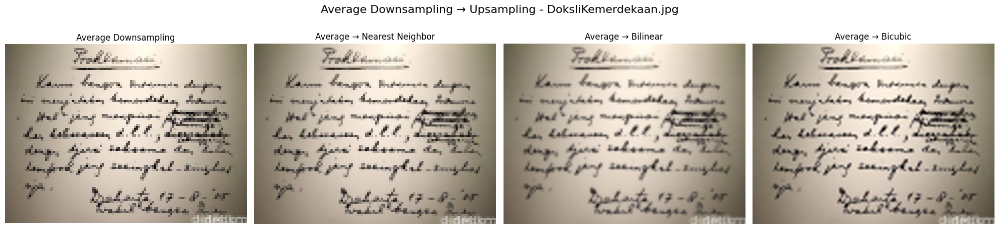

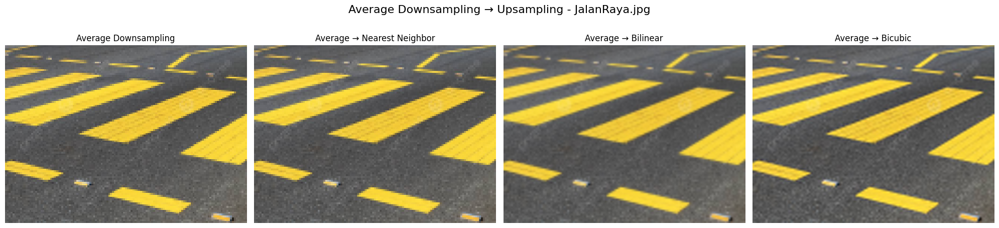

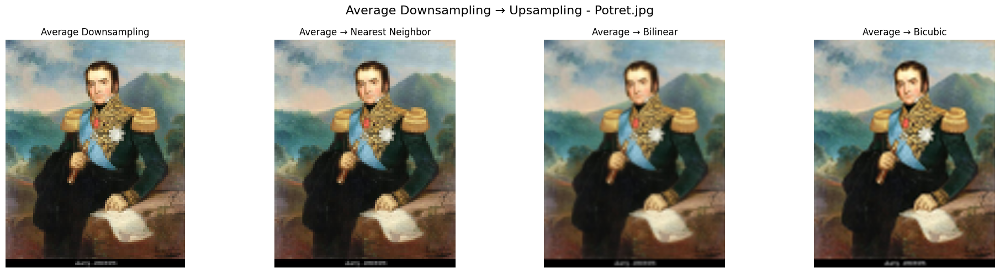

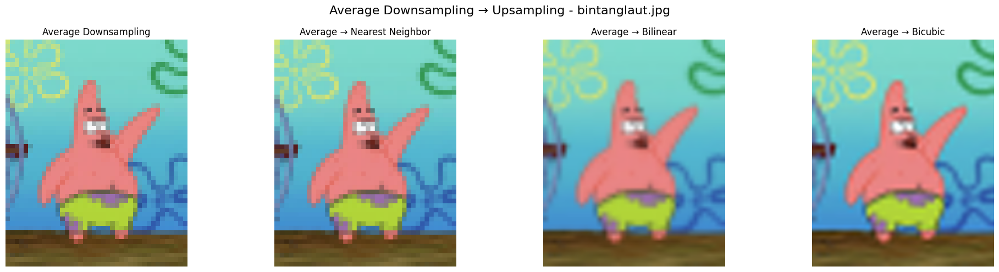

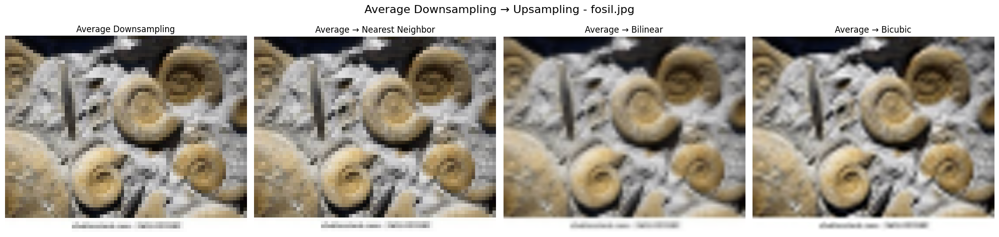

In [114]:
for image_file in image_files:
  input_path = os.path.join(INPUT_FOLDER,image_file)
  image = load_image(input_path)
  downsampled = average_downsampling(image,scale=5)
  original_size = (image.shape[1],image.shape[0])
  average_nn = nearest_neighbor(downsampled,original_size)
  average_bilinear = bilinear(downsampled,original_size)
  average_bicubic = bicubic(downsampled,original_size)
  base_name = os.path.splitext(image_file)[0]
  fig, axes = plt.subplots(1,4,figsize=(20, 5))

  axes[0].imshow(downsampled)
  axes[0].set_title("Average Downsampling")
  axes[0].axis("off")


  axes[1].imshow(average_nn)
  axes[1].set_title("Average → Nearest Neighbor")
  axes[1].axis("off")

  axes[2].imshow(average_bilinear)
  axes[2].set_title("Average → Bilinear")
  axes[2].axis("off")


  axes[3].imshow(average_bicubic)
  axes[3].set_title("Average → Bicubic")
  axes[3].axis("off")

  plt.suptitle(f"Average Downsampling → Upsampling - {image_file}",fontsize=16)
  plt.tight_layout()
  save_path = os.path.join(OUTPUT_FOLDER,f"{base_name}_average_comparison.jpg")
  plt.savefig(save_path,dpi=300,bbox_inches="tight")

  plt.show()
  plt.close()

## 3. Conclusion

In conclusion, down sampling reduces image resolution and causes some image details to be lost, while up sampling increases the image size using interpolation. Among the up sampling methods tested, Nearest Neighbor produces the most pixelated result, Bilinear produces a smoother result, and Bicubic generally produces the most natural-looking result. Therefore, the choice of sampling method depends on the desired image quality and the purpose of the image processing task.